In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.dataset.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.roboflow.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/split.py
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00108_jpg.rf.3335d7cd1850cfa9d60d5bf7b48b5f33.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/10_00103_jpg.rf.1549154b51978d775abdb07b0bbf8ed7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/6_00054_jpg.rf.e55a6a8deba73ad5807c903e5299991d.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00088_jpg.rf.a4abd94687414d676ac4047fb693d2d7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/3_00149_jpg.rf.cf5567a5c4ca41e0ac97599663a260e9.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/11_00031_jpg.rf.fb6cad24e

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.7/882.7 kB 15.9 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


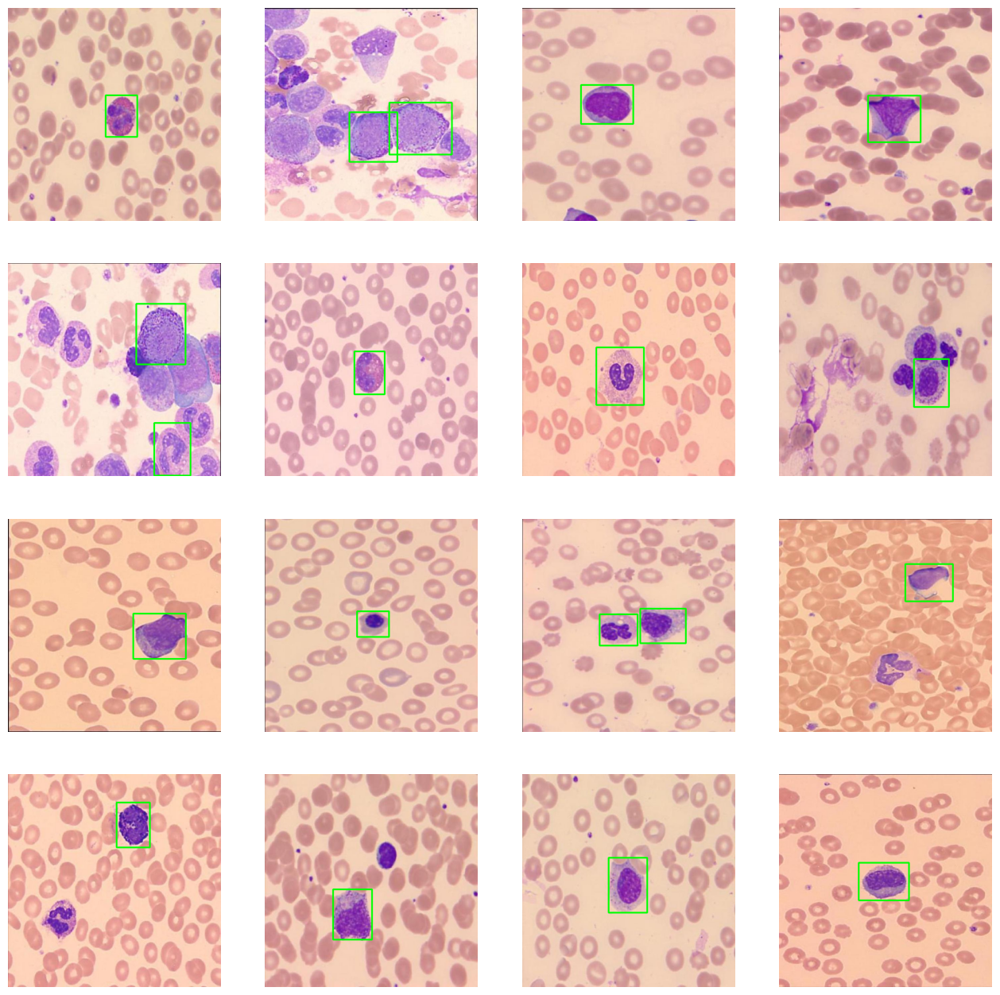

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images"
train_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels"

test_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images"
test_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels"

val_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/images"
val_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images/10_00001_jpg.rf.4fcbf927a55ca52647a1f9e5d1beb0b7.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [6]:
from ultralytics import YOLO
# Build a YOLOv9c model from pretrained weight
model = YOLO("yolov9s.pt")

100%|██████████| 14.7M/14.7M [00:00<00:00, 138MB/s]


In [7]:

# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml',  
    epochs=80,
    imgsz=640,                                  
    device='0'                       
)


Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.pt, data=/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels

100%|██████████| 755k/755k [00:00<00:00, 13.8MB/s]
2024-10-11 23:15:46,285	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-11 23:15:46,887	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     31104  ultralytics.nn.modules.block.ELAN1           [64, 64, 64, 32]              
  3                  -1  1     73984  ultralytics.nn.modules.block.AConv           [64, 128]                     
  4                  -1  1    258432  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 128, 128, 64, 3]        
  5                  -1  1    221568  ultralytics.nn.modules.block.AConv           [128, 192]                    
  6                  -1  1    579648  ultralytics.nn.modules.block.RepNCSPELAN4    [192, 192, 192, 96, 3]        
  7                  -1  1    442880  ultralytic

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...


100%|██████████| 5.35M/5.35M [00:00<00:00, 65.8MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels... 5803 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5803/5803 [00:21<00:00, 273.52it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels... 717 images, 0 backgrounds, 0 corrupt: 100%|██████████| 717/717 [00:02<00:00, 259.46it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 227 weight(decay=0.0), 234 weight(decay=0.0005), 233 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      5.31G     0.7935      3.325      1.035         16        640: 100%|██████████| 363/363 [02:29<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:08<00:00,  2.59it/s]

                   all        717        809      0.392      0.651       0.47      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      5.25G     0.7462          2      1.002         20        640: 100%|██████████| 363/363 [02:22<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]


                   all        717        809        0.5      0.691      0.584      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      5.25G     0.7491      1.595      1.025         26        640: 100%|██████████| 363/363 [02:18<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]

                   all        717        809      0.642      0.704      0.704      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      5.24G     0.7225      1.356       1.02         11        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]

                   all        717        809      0.501      0.657      0.608      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80      5.25G      0.708      1.243      1.014         20        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.657      0.689      0.708       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      5.26G     0.6793      1.115      1.003         19        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        717        809      0.653      0.745      0.771      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      5.23G     0.6795      1.068      1.002         15        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.708       0.75      0.795      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80      5.24G     0.6641      1.036     0.9964         18        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]

                   all        717        809      0.724      0.814      0.823      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      5.25G     0.6566     0.9856     0.9924         23        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.725      0.786      0.803      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      5.41G     0.6472     0.9479     0.9853         26        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]

                   all        717        809      0.734      0.794      0.821      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      5.26G     0.6432     0.9281     0.9873         14        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]

                   all        717        809       0.77      0.758      0.828      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      5.23G      0.634     0.8913     0.9848         14        640: 100%|██████████| 363/363 [02:17<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]

                   all        717        809      0.785      0.784      0.837      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      5.26G     0.6345     0.8778     0.9815         24        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809      0.752      0.828      0.858      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80      5.24G     0.6296     0.8705     0.9827         20        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        717        809       0.77      0.833      0.854      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      5.23G     0.6271     0.8437     0.9809         21        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]

                   all        717        809      0.824      0.827      0.882      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      5.24G      0.621     0.8284     0.9826         16        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        717        809      0.757      0.821      0.845      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      5.24G     0.6227     0.8093     0.9823         14        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.822      0.831      0.886      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80      5.24G     0.6193     0.7994     0.9771         22        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.18it/s]

                   all        717        809       0.85       0.78      0.876      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      5.24G     0.6058     0.7818     0.9724         26        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809      0.831      0.821      0.888      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      5.23G     0.6019      0.765     0.9707         22        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809       0.82      0.844      0.887      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      5.25G     0.6038     0.7461     0.9741         15        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.18it/s]

                   all        717        809      0.826       0.84      0.891      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      5.23G     0.5899     0.7335     0.9668         23        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]

                   all        717        809      0.844      0.814      0.887      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80      5.24G     0.6011     0.7018      0.969         14        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.854      0.856      0.907      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      5.25G     0.5958     0.7177      0.968         26        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809      0.809      0.894      0.911      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      5.24G      0.594     0.7104      0.968         22        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809      0.773      0.859      0.893      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      5.24G     0.5855     0.6805     0.9621         12        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.818        0.8      0.886      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      5.24G     0.5937     0.6894     0.9664         21        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.855      0.852       0.91      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80      5.24G      0.579     0.6562     0.9633         20        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809       0.86      0.879      0.922      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      5.25G      0.585     0.6662     0.9646         15        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]

                   all        717        809      0.811      0.873      0.914      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      5.24G     0.5761     0.6291     0.9597         23        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.20it/s]

                   all        717        809       0.87      0.879      0.925       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      5.23G     0.5767     0.6234     0.9637         24        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]

                   all        717        809      0.861      0.864       0.92      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      5.24G       0.57     0.6094     0.9552         17        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.18it/s]

                   all        717        809      0.879      0.869      0.932      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80      5.25G     0.5739     0.6131     0.9573         21        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        717        809      0.872      0.892      0.928      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80      5.24G     0.5608     0.5979      0.952         15        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        717        809      0.866      0.882      0.935       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80      5.25G     0.5689     0.5954     0.9583         28        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.895      0.884      0.943      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      5.24G     0.5685     0.5722     0.9543         20        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.22it/s]

                   all        717        809      0.901      0.879      0.942      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80      5.25G     0.5677     0.5747     0.9554         18        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.21it/s]

                   all        717        809      0.885      0.896      0.942      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80      5.24G     0.5538     0.5484     0.9497         19        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]

                   all        717        809      0.887      0.869      0.931       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      5.26G     0.5554     0.5598     0.9513         15        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.18it/s]

                   all        717        809      0.877      0.919      0.948      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80      5.24G     0.5551      0.543      0.951         22        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]

                   all        717        809      0.899      0.897      0.946      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80      5.24G     0.5537     0.5393     0.9495         28        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809      0.928      0.895      0.958      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80      5.24G     0.5528     0.5217     0.9501         24        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.905      0.889      0.946      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      5.23G     0.5436     0.5093     0.9436         20        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        717        809      0.891      0.915      0.957      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      5.25G      0.542     0.5063     0.9421         17        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.20it/s]

                   all        717        809       0.91      0.927      0.967      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      5.24G     0.5483     0.4966     0.9483         14        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.891      0.936      0.961      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      5.24G     0.5402     0.4856     0.9419         25        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.22it/s]

                   all        717        809      0.909      0.928      0.967      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80      5.23G     0.5343     0.4798     0.9385         14        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        717        809      0.925      0.919      0.966       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      5.24G     0.5323     0.4764     0.9407         21        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.895      0.926      0.963      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80      5.24G     0.5368     0.4778     0.9454         15        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]

                   all        717        809      0.919      0.934      0.968      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      5.25G     0.5287     0.4585     0.9394         20        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        717        809      0.922      0.919      0.967      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80      5.24G     0.5245     0.4516     0.9345         22        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.915      0.944      0.973      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      5.24G      0.525     0.4376     0.9368         27        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        717        809      0.933      0.931      0.972      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80      5.24G     0.5141     0.4248     0.9304         24        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809       0.94      0.927      0.974      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      5.23G     0.5227     0.4386     0.9353         19        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809       0.95       0.93      0.976      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80      5.24G       0.52     0.4356     0.9347         22        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.923      0.942      0.975      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80      5.24G     0.5159     0.4212     0.9366         17        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]

                   all        717        809      0.936      0.936      0.975      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80      5.24G     0.5121     0.4139     0.9296         19        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809      0.956      0.932      0.978      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80      5.24G     0.5006     0.4097     0.9276         23        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]

                   all        717        809      0.946      0.946      0.979      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80      5.24G     0.5089     0.4058     0.9269         22        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]

                   all        717        809      0.951      0.946       0.98        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80      5.24G     0.4972      0.393      0.926         21        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.18it/s]

                   all        717        809      0.949      0.936      0.979        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      5.26G     0.4947     0.3902     0.9224         28        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.959      0.952       0.98      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80      5.25G     0.4953     0.3853     0.9231         15        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.965      0.944      0.983      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      5.25G     0.4921     0.3752      0.917         14        640: 100%|██████████| 363/363 [02:17<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]

                   all        717        809      0.957      0.948      0.984      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80      5.23G      0.491     0.3616     0.9184         22        640: 100%|██████████| 363/363 [02:17<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.955      0.945      0.984      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80      5.24G     0.4855     0.3675     0.9167         23        640: 100%|██████████| 363/363 [02:17<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]

                   all        717        809       0.96      0.949      0.983      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      5.23G     0.4863     0.3635     0.9198         24        640: 100%|██████████| 363/363 [02:17<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]

                   all        717        809      0.954      0.963      0.983      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80      5.24G     0.4782     0.3575     0.9174         21        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.949      0.964      0.983      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80      5.23G     0.4816     0.3524     0.9234         22        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809      0.955      0.955      0.982      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80      5.25G     0.4785     0.3407     0.9109         23        640: 100%|██████████| 363/363 [02:17<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.953      0.964      0.982      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      5.25G     0.4773     0.3519     0.9177         22        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.964      0.963      0.985       0.91


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      5.24G     0.4141     0.2424     0.8798         13        640: 100%|██████████| 363/363 [02:17<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        717        809       0.96      0.948      0.983      0.908



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      5.23G     0.4044     0.2228     0.8721         11        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        717        809      0.965      0.959      0.985      0.911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      5.25G     0.3988     0.2141     0.8732         11        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        717        809      0.965      0.959      0.985      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      5.23G     0.3972     0.2073     0.8688         13        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]

                   all        717        809      0.954      0.965      0.985      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      5.24G     0.3936     0.2054     0.8711         11        640: 100%|██████████| 363/363 [02:16<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]

                   all        717        809      0.962      0.956      0.985      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      5.25G     0.3899      0.202     0.8654         11        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]

                   all        717        809      0.956      0.966      0.985      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      5.24G      0.385     0.1985     0.8613         13        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]

                   all        717        809       0.95      0.969      0.984      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      5.23G     0.3845     0.1942     0.8632         11        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.20it/s]

                   all        717        809      0.948      0.975      0.984      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      5.24G     0.3818     0.1955     0.8612         11        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.18it/s]

                   all        717        809      0.948      0.975      0.985      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80      5.23G     0.3768     0.1858     0.8624         12        640: 100%|██████████| 363/363 [02:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]

                   all        717        809      0.956      0.969      0.985      0.918



80 epochs completed in 3.251 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 13.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 13.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 504 layers, 6,198,292 parameters, 0 gradients, 22.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:07<00:00,  2.96it/s]


                   all        717        809      0.956      0.969      0.985      0.918
   Atypical lymphocyte         62         72       0.94      0.944      0.973       0.87
       Band Neutrophil         63         73      0.879          1      0.978      0.907
              Basophil         72         73      0.994          1      0.995      0.934
                 Blast         28         63      0.968      0.971      0.985      0.942
            Eosinophil         58         59      0.992      0.983       0.99      0.906
            Lymphocyte         68         69      0.985      0.986      0.992       0.93
         Metamyelocyte         67         68      0.946      0.941      0.985      0.934
              Monocyte         55         57      0.933      0.984      0.991      0.954
             Myelocyte         56         62      0.921      0.968      0.965      0.865
                   NRC         53         58      0.974      0.983      0.994      0.919
          Promyelocyt

lr/pg0,▆███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▁
lr/pg1,███▇▇▇▇▇▆▆▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▁▁▁
lr/pg2,▃▆███▇▇▇▇▇▆▆▆▆▆▆▆▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁
metrics/mAP50(B),▁▃▄▃▄▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇██████████████████
metrics/mAP50-95(B),▂▁▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████████
metrics/precision(B),▁▂▂▄▄▅▆▆▇▆▇▆▇▆▇▇▇▇▇█▇█▇▇▇▇██████████████
metrics/recall(B),▁▂▂▁▃▄▄▄▅▅▅▅▅▆▄▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇█████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▇▆▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▂▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebd8c341810>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,  

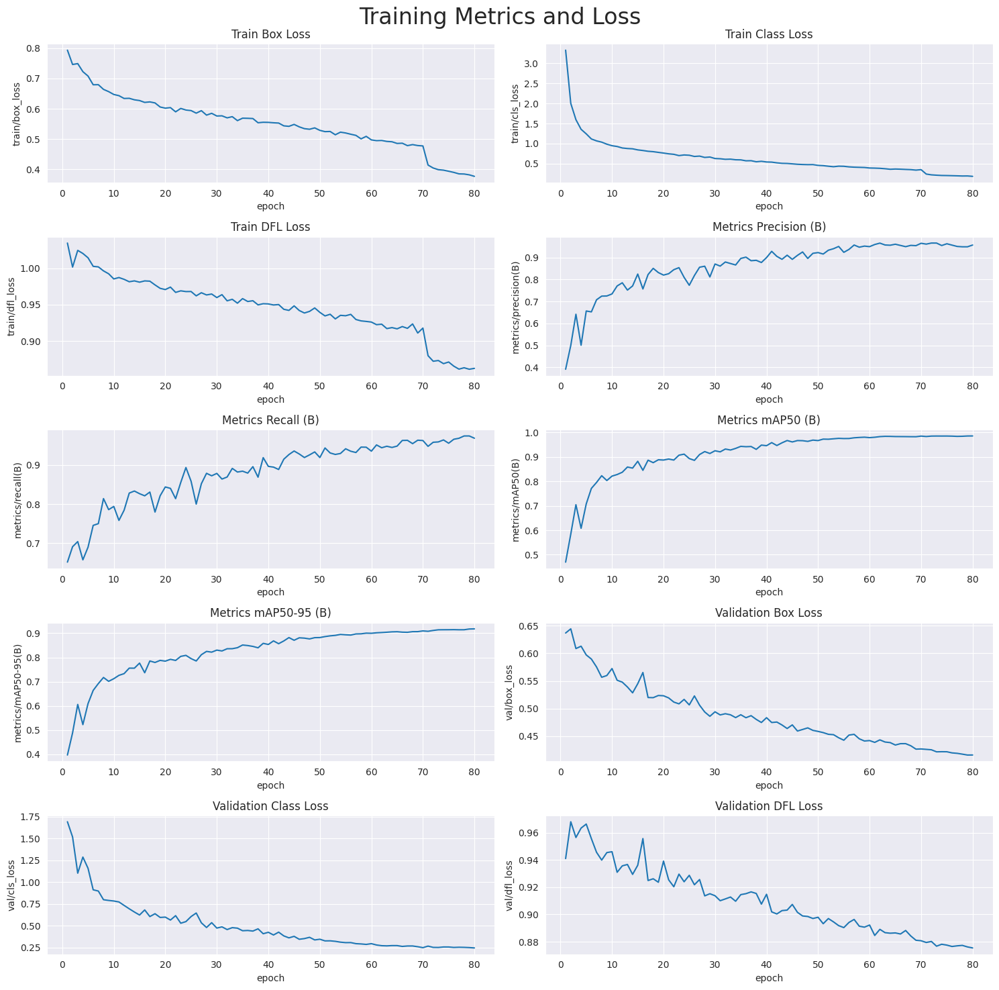

In [8]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [9]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 504 layers, 6,198,292 parameters, 0 gradients, 22.1 GFLOPs


val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels... 667 images, 0 backgrounds, 0 corrupt: 100%|██████████| 667/667 [00:02<00:00, 240.53it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:10<00:00,  3.92it/s]


                   all        667        817       0.81      0.817       0.83       0.75
   Atypical lymphocyte         98        105      0.907      0.771      0.879      0.735
       Band Neutrophil         80         99      0.868      0.697      0.828      0.772
              Basophil         90         99          1      0.889      0.944       0.85
                 Blast         54        121      0.975      0.934      0.965       0.89
         Metamyelocyte         86         87      0.761      0.767      0.768      0.721
             Myelocyte         82        100      0.683      0.688      0.665      0.573
                   NRC         87         91      0.869      0.901      0.902      0.786
          Promyelocyte         73         92      0.785      0.924      0.891      0.835
  Segmented neutrophil         20         23      0.438      0.783      0.622      0.588
Speed: 0.2ms preprocess, 11.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detec

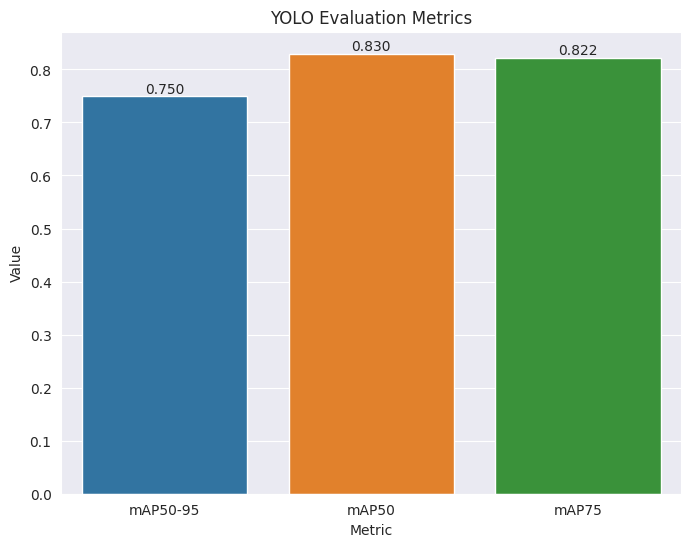

In [10]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

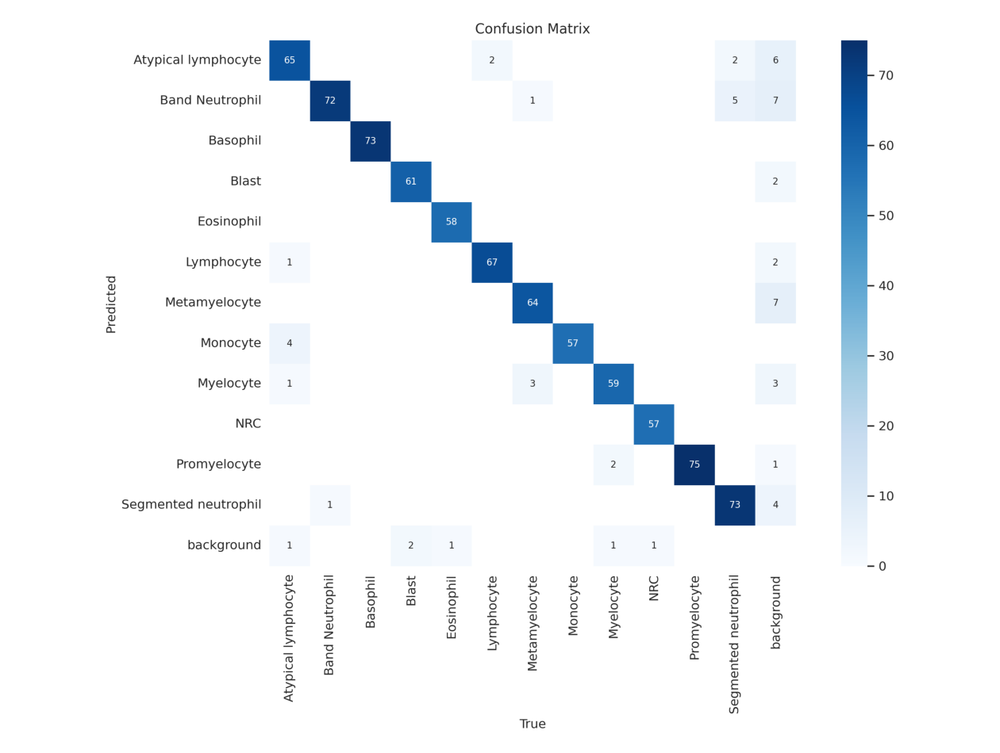

In [11]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

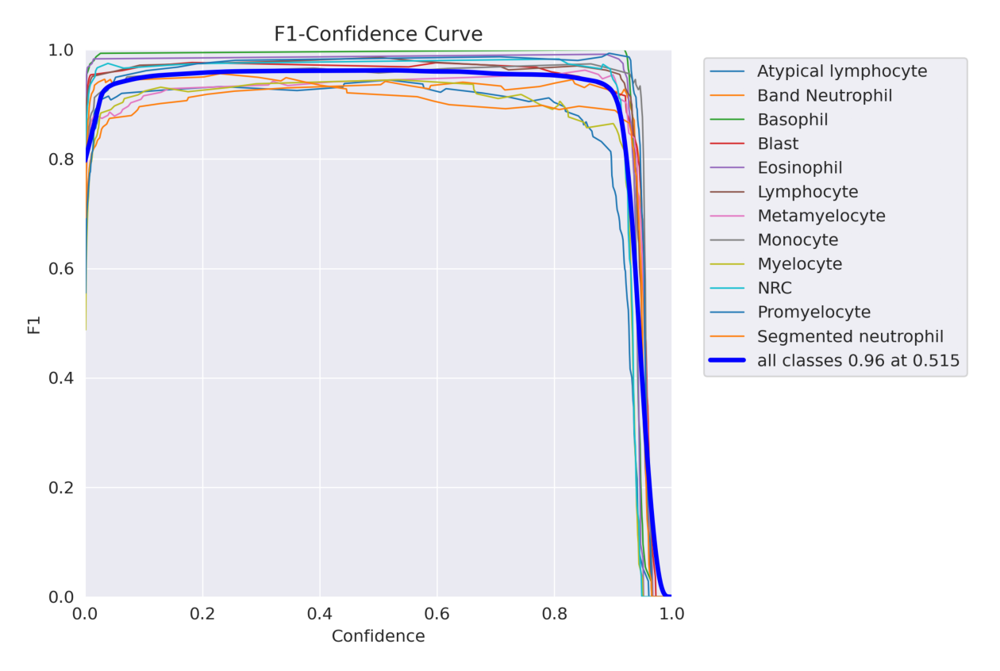

In [12]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/F1_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

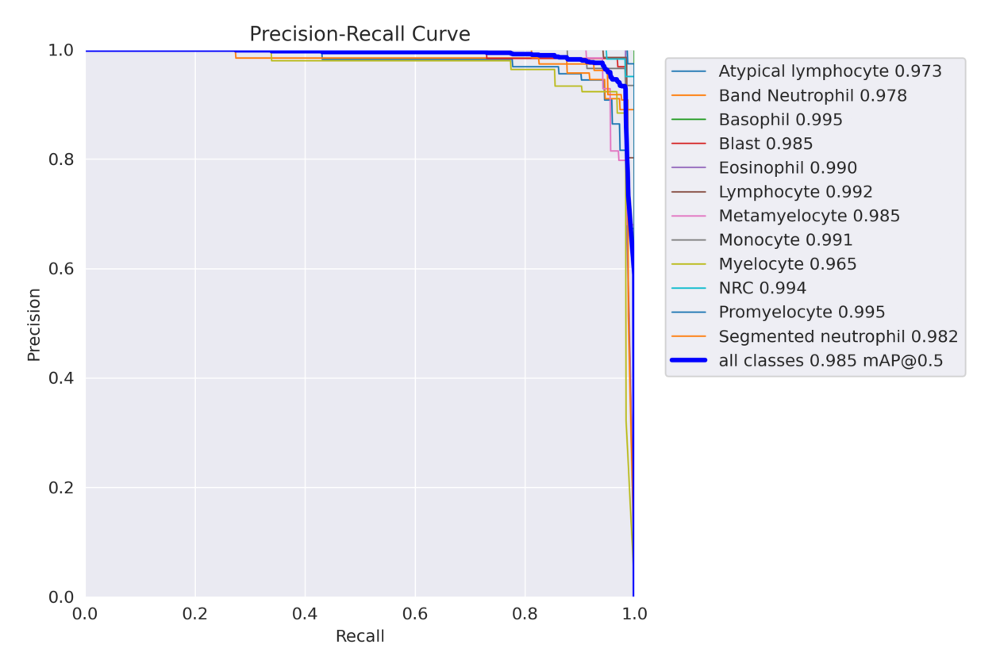

In [13]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/PR_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

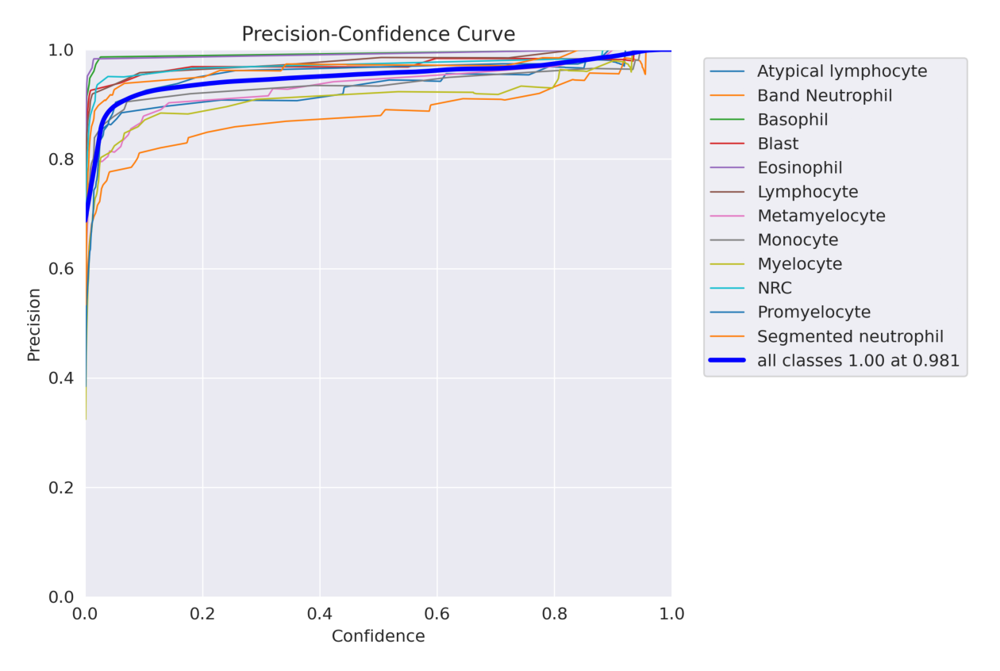

In [14]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/P_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

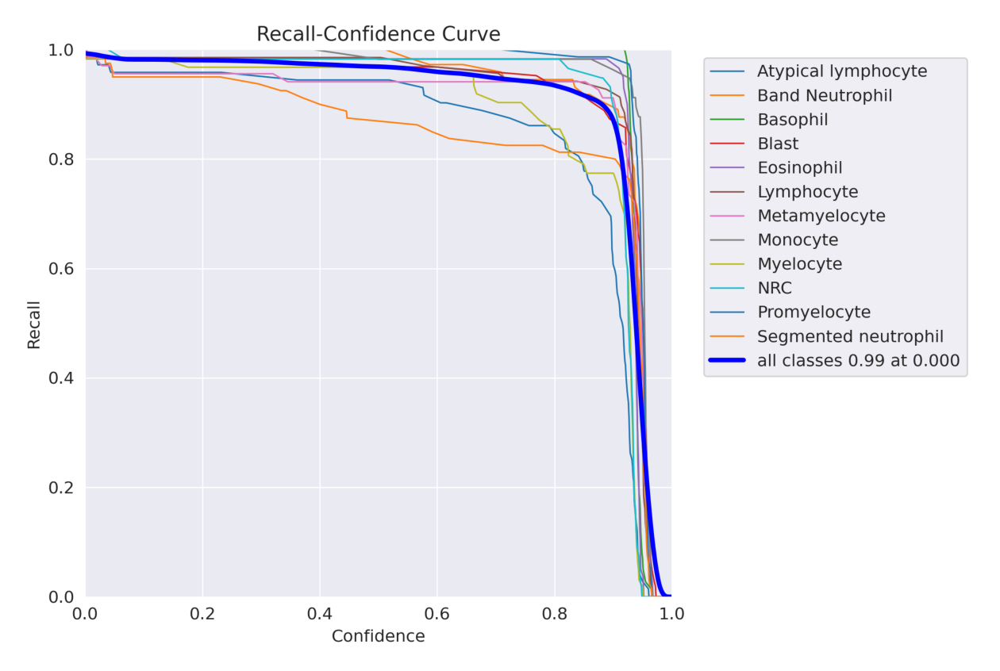

In [15]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/R_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

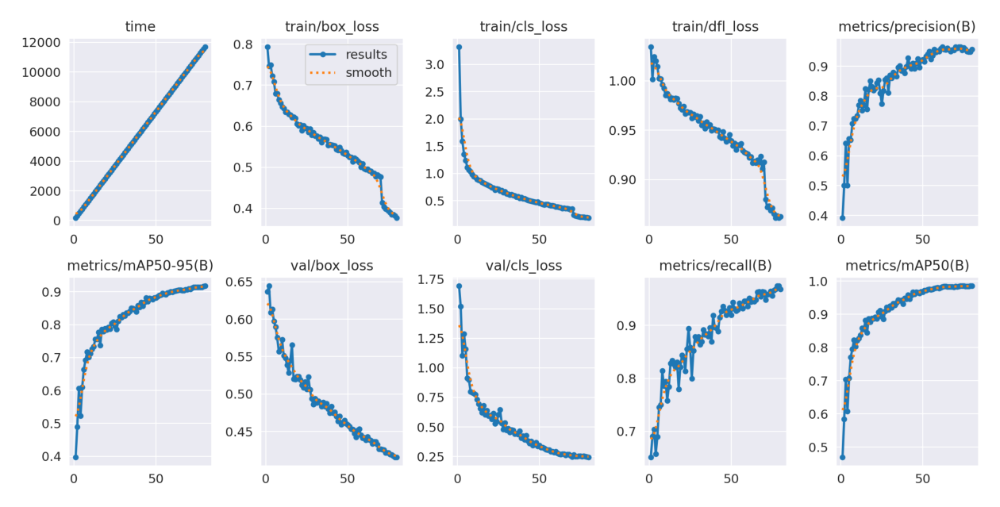

In [16]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train/results.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

In [17]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 Atypical lymphocyte, 19.3ms
Speed: 1.7ms preprocess, 19.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Promyelocyte, 19.8ms
Speed: 3.2ms preprocess, 19.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 NRC, 19.8ms
Speed: 3.0ms preprocess, 19.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 21.4ms
Speed: 1.8ms preprocess, 21.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 19.3ms
Speed: 1.8ms preprocess, 19.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Myelocyte, 19.3ms
Speed: 1.9ms preprocess, 19.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 19.3ms
Speed: 2.1ms preprocess, 19.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 17.4ms
Speed: 1.8ms preprocess, 17.4ms inference, 1.2ms pos

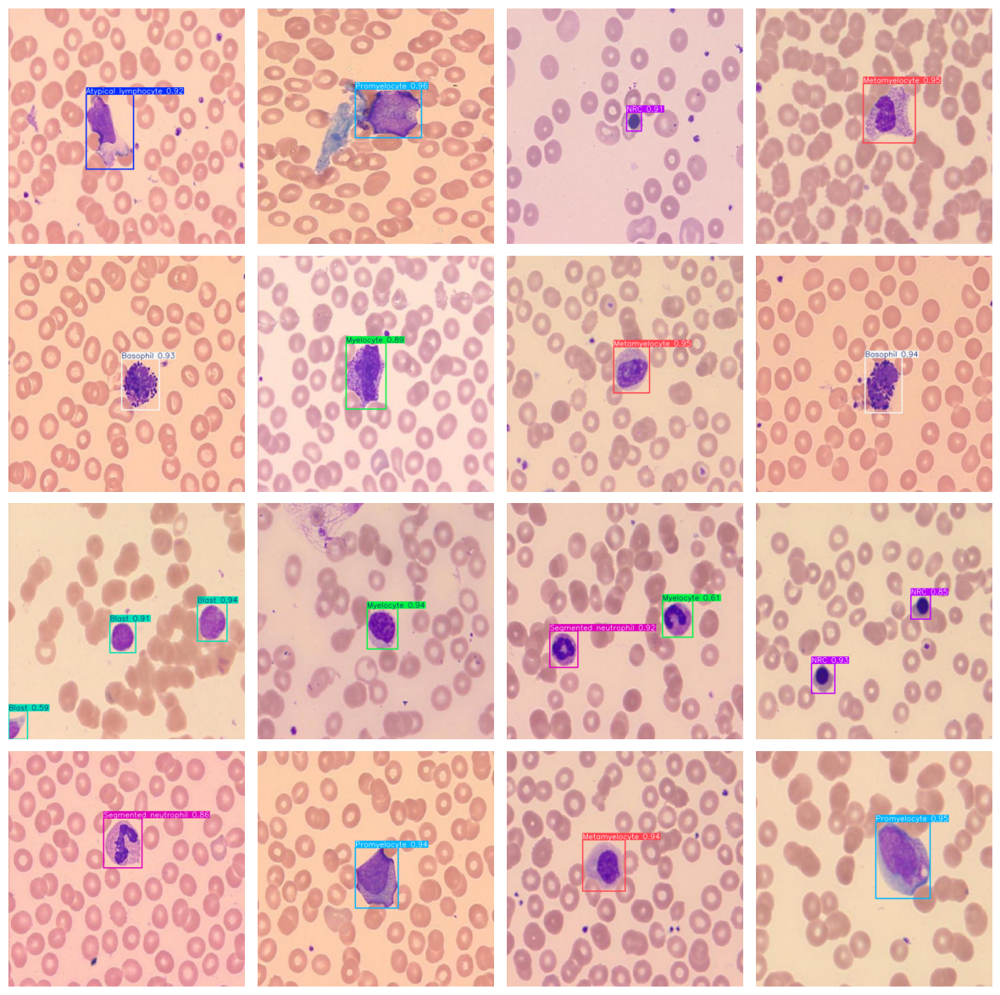

In [18]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [19]:
# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/detect/train/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.4,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00004_jpg.rf.33467f06547bca1934fbe5b5de747cf6.jpg: 640x640 1 Basophil, 20.5ms
image 2/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00006_jpg.rf.28e543e681b9d7532c911330ca0227b1.jpg: 640x640 1 Basophil, 19.4ms
image 3/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00010_jpg.rf.a8602ac6d9d1bff63810a82ee50fb04c.jpg: 640x640 1 Basophil, 19.7ms
image 4/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00016_jpg.rf.4ad41e92e2133917baccddeed12fc2f7.jpg: 640x640 1 Basophil, 19.3ms
image 5/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00026_jpg.rf.2a2c868b960df62918cbabd6cfcc5c24.jpg: 640x640 1 Basophil, 19.4ms
image 6/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00031_jpg.rf.9cadd0cc75ee9d59ea73a974e92e60f8.jpg: 640x640 1 Basophil, 19.3ms
image 7/667 /ka

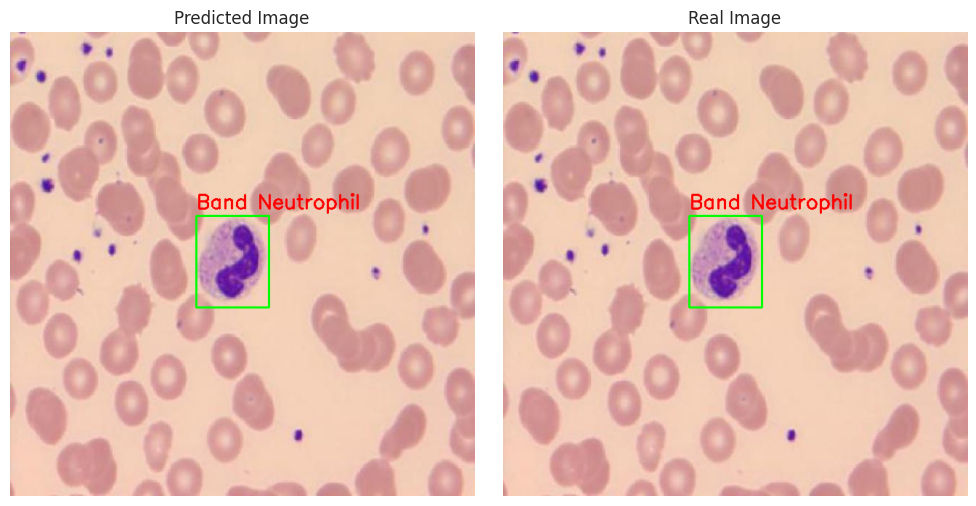

In [20]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


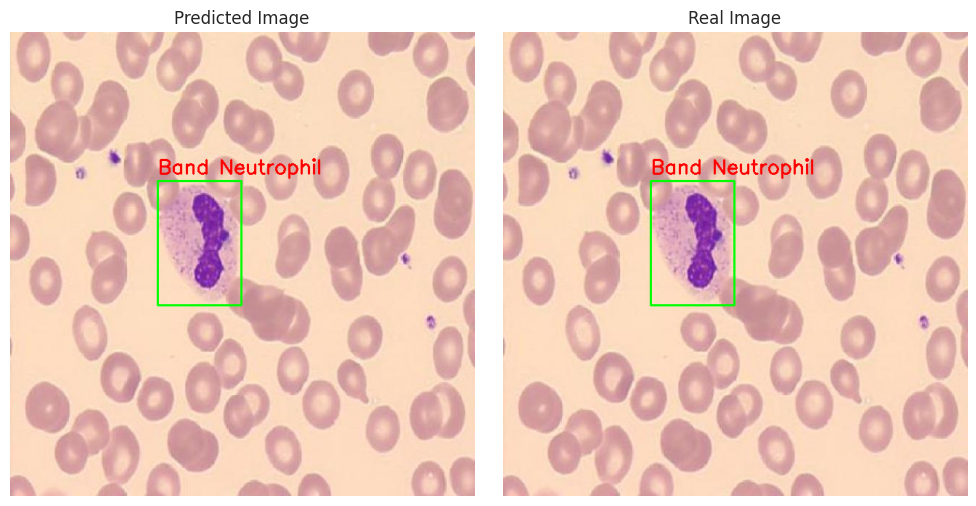

In [21]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


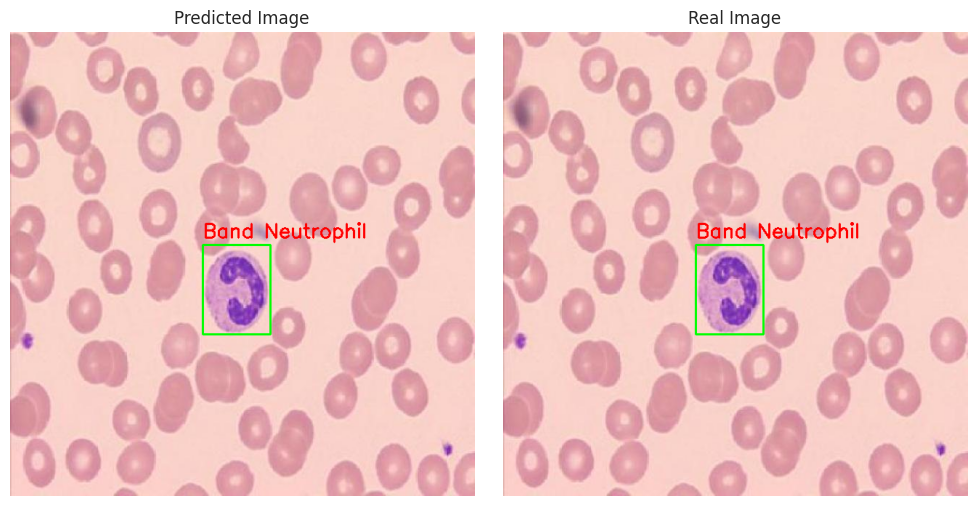

In [22]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


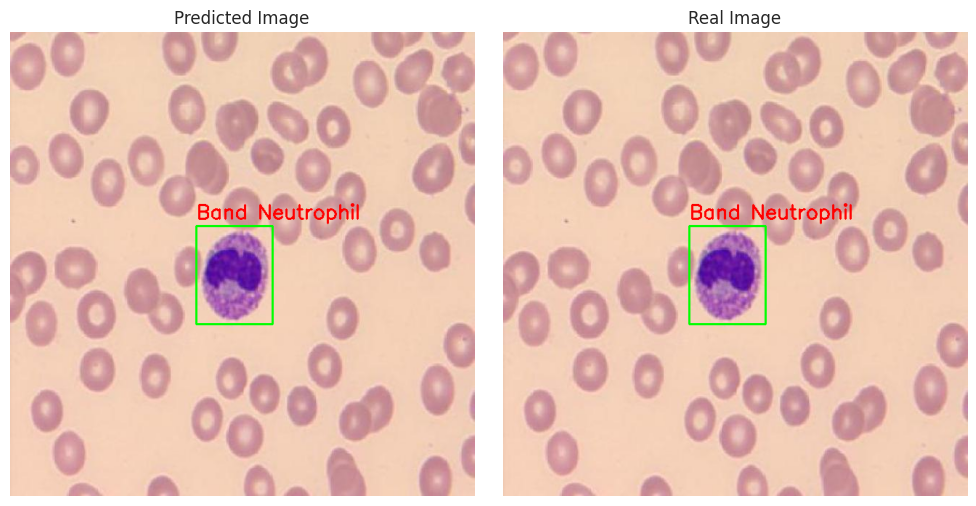

In [23]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


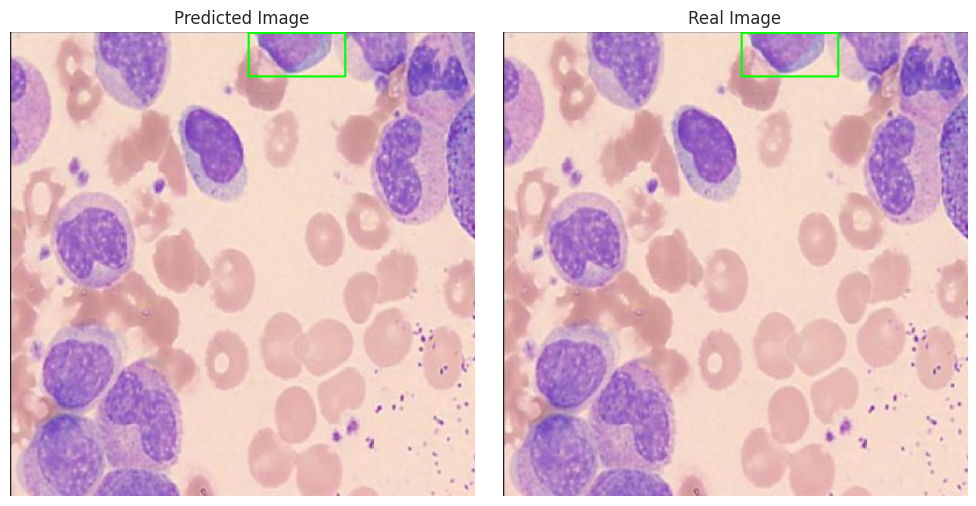

In [24]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


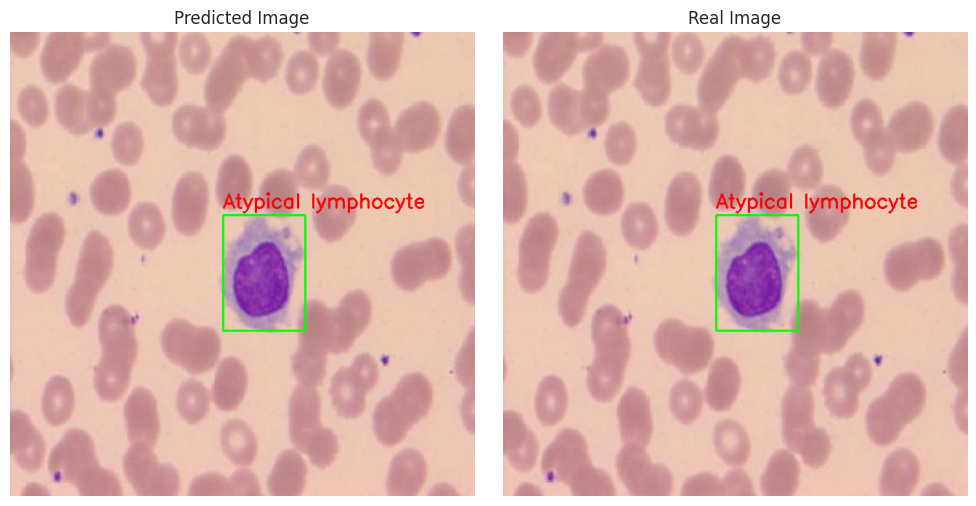

In [25]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


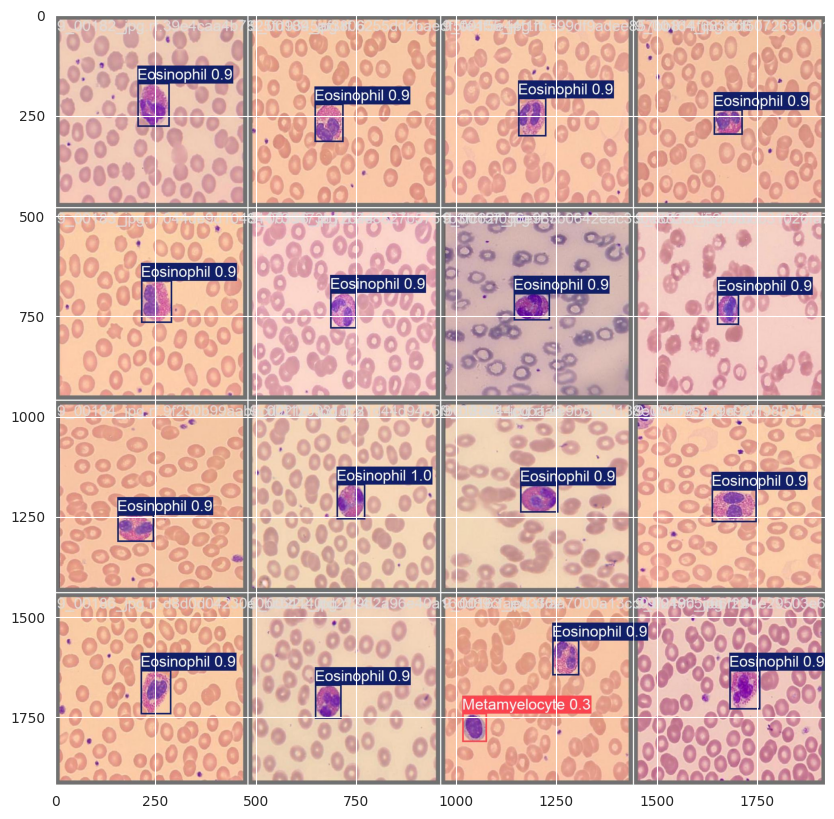

In [26]:
from PIL import Image  # Importing the Image module from PIL
import matplotlib.pyplot as plt
image_path = '/kaggle/working/runs/detect/train/val_batch0_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()

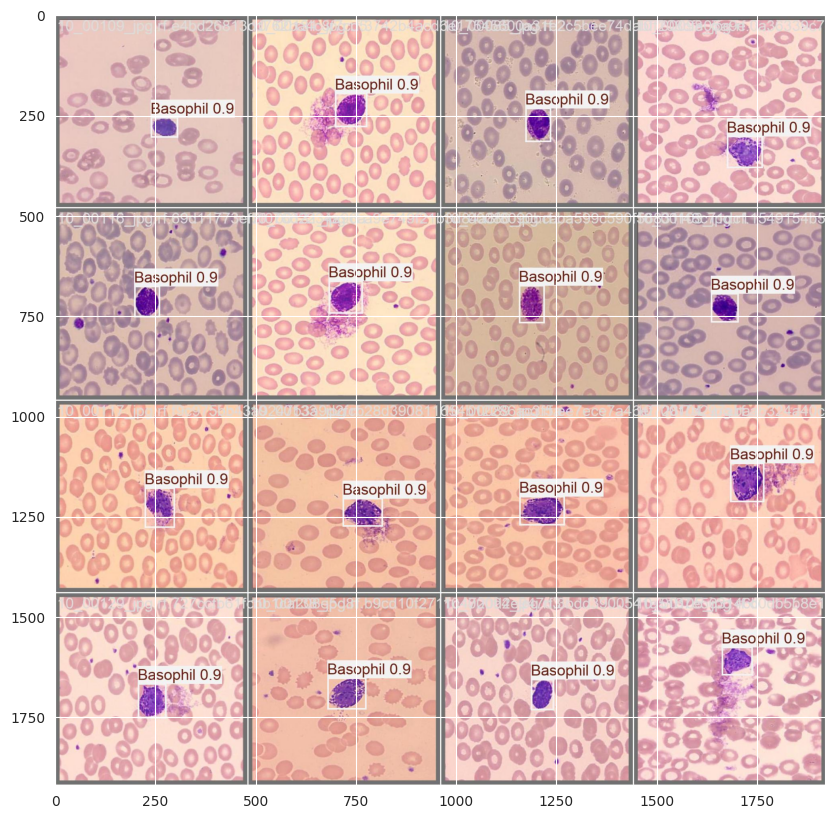

In [27]:
image_path = '/kaggle/working/runs/detect/train/val_batch1_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()